In [2]:
import numpy as np
import json
import matplotlib.pyplot as plt
import os
import re
import scipy.ndimage
import random

In [3]:
%matplotlib inline

In [4]:
files = os.listdir('data')
names = []
for i in files:
    m = re.search('.*json', i)
    if m <> None:
        names.append('data/'+i)

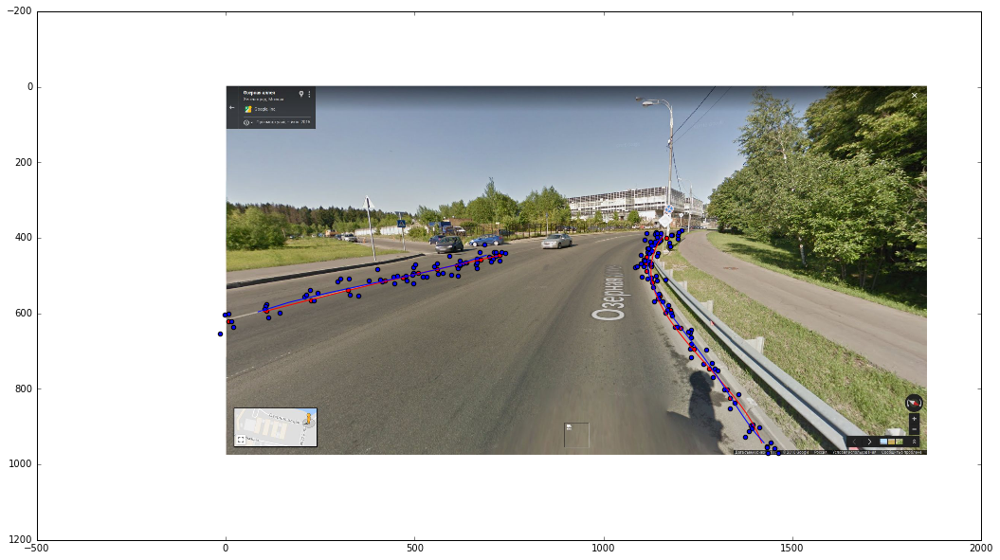

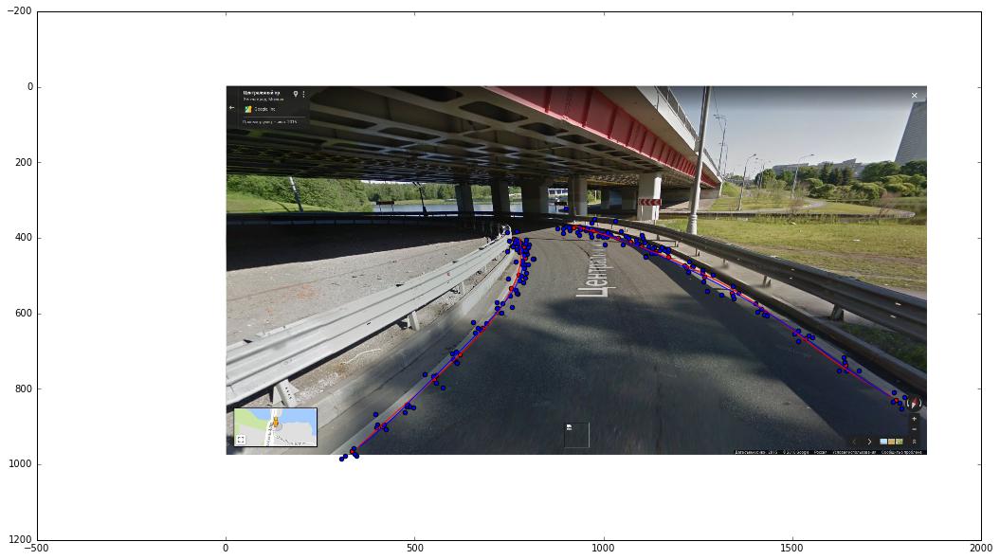

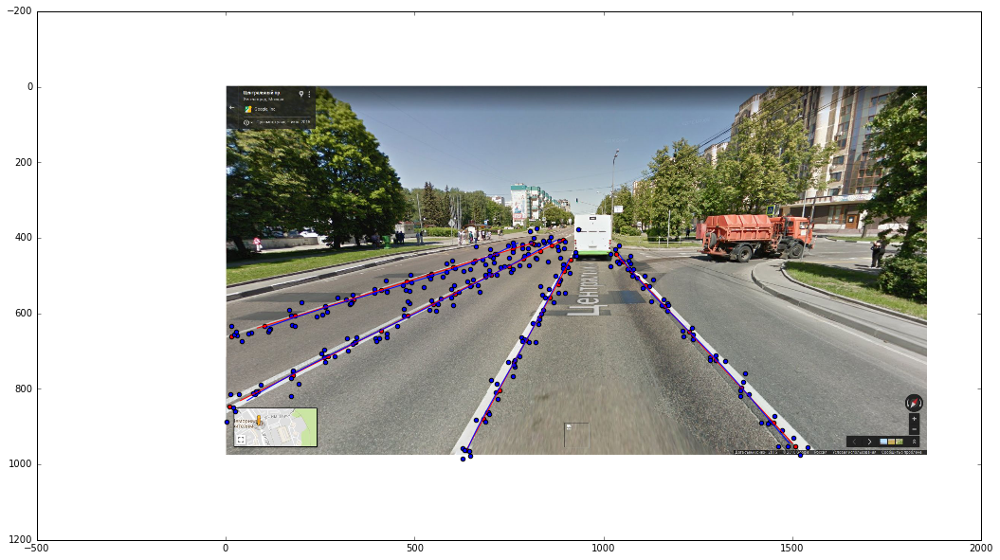

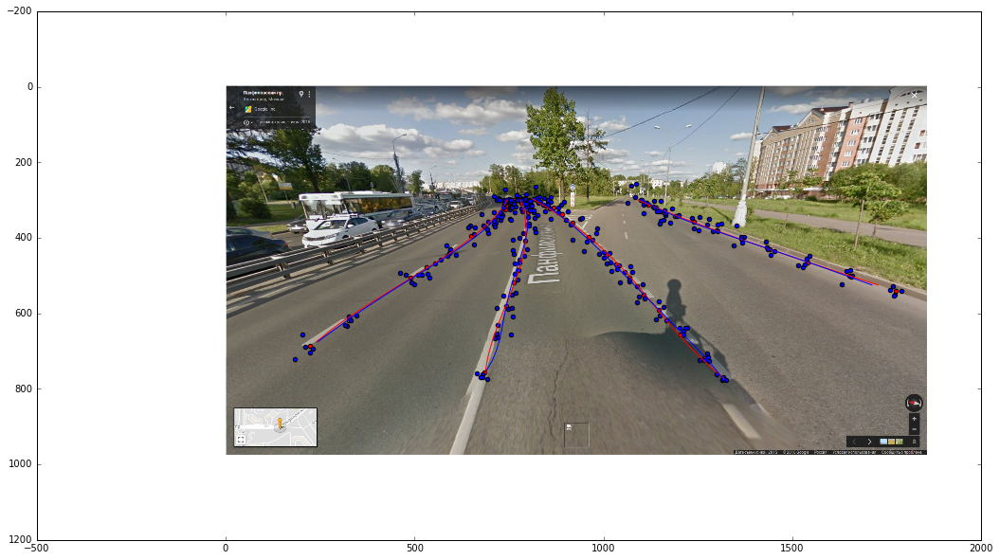

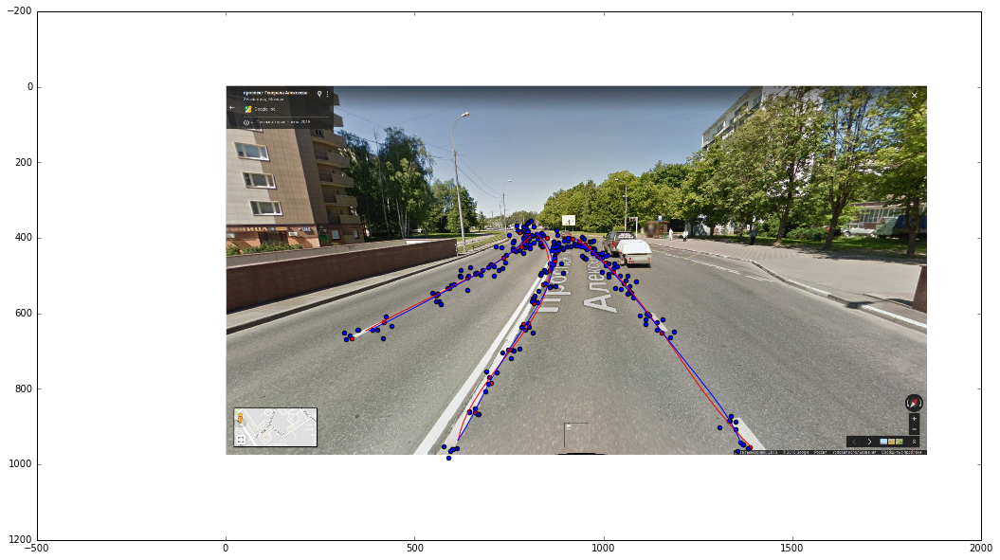

...

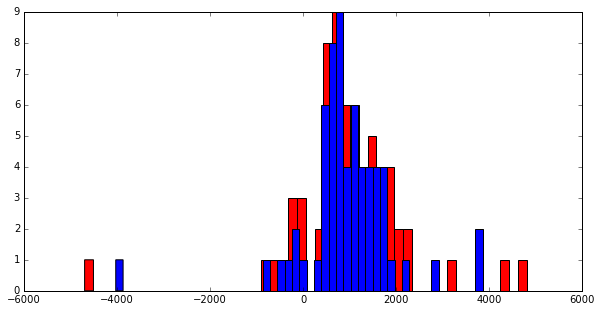

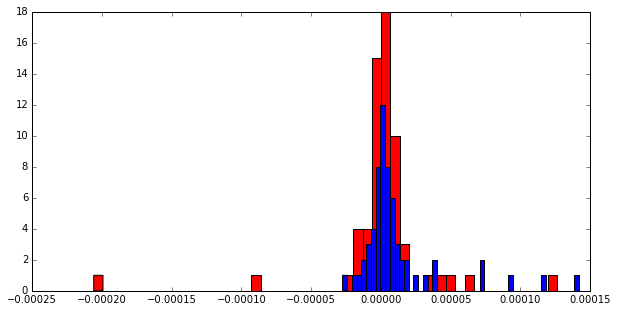

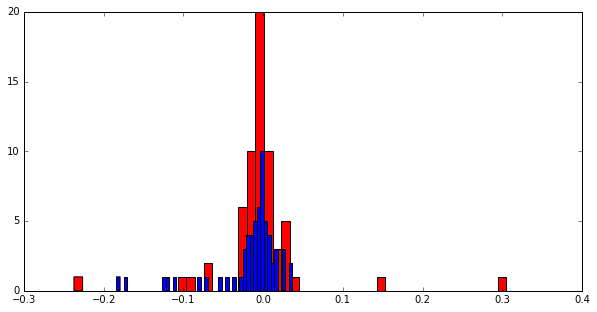

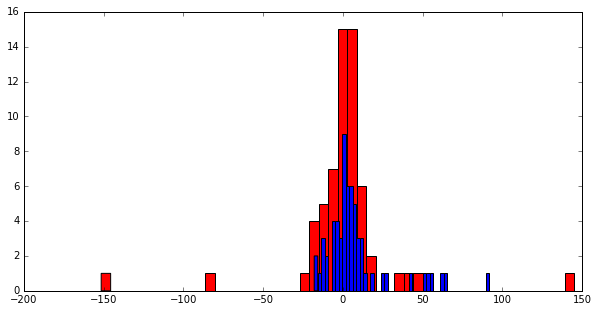

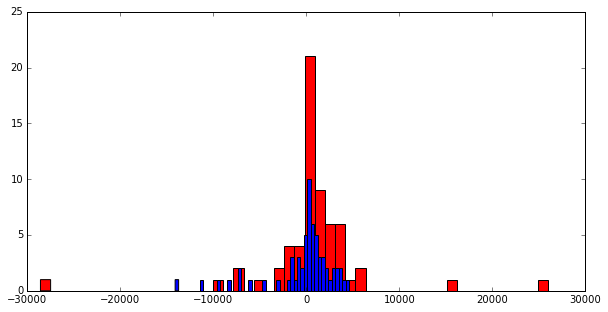

In [7]:
SIGMA = 15
NOISE_NUMBER = 5
coef = []
coef_noise = []
for name in names:
    data = json.load(open(name))
    X = dict()
    X_noise = dict()
    points = data[data.keys()[0]]['regions']
    for pointKey in points.keys():
        line = points[pointKey]['region_attributes']['line']
        pointCoord = points[pointKey]['shape_attributes']
        if (line not in X):
            X[line] = []
            X_noise[line] = []
        X[line].append([pointCoord['cx'], pointCoord['cy']])
        for i in range(NOISE_NUMBER):
            X_noise[line].append([random.gauss(pointCoord['cx'], SIGMA), random.gauss(pointCoord['cy'], SIGMA)])
    
    image = scipy.ndimage.imread(name[:-5]+'.jpeg')
    plt.figure(figsize = (25, 10))
    plt.imshow(image)

    for key in X:
        line = np.array(X[key])
        plt.scatter(line[:,0], line[:,1], c='r')
        line_noise = np.array(X_noise[key])
        plt.scatter(line_noise[:,0], line_noise[:,1])
        
        coef_loc = []
        for i in range(1, 4):
            c = np.polyfit(line[:,1], line[:,0], i, full=True)
            #print 'Коэффициенты: ', c[0] 
            coef_loc.extend(c[0])
        coef.append(coef_loc)
        
        x = np.array(range(int(min(line[:,1])), int(max(line[:,1])), 25))
        y = np.zeros(x.size)
        for j in range(i+1):
            y += c[0][j] * x**(i-j)
        plt.plot(y, x, c='r')
        
        coef_loc = []
        for i in range(1, 5):
            c = np.polyfit(line_noise[:,1], line_noise[:,0], i, full=True)
            #print 'Коэффициенты: ', c[0] 
            coef_loc.extend(c[0])
        coef_noise.append(coef_loc)
        
        x = np.array(range(int(min(line[:,1])), int(max(line[:,1])), 25))
        y = np.zeros(x.size)
        for j in range(i+1):
            y += c[0][j] * x**(i-j)
        plt.plot(y, x, c='b')

    plt.show()

coef = np.array(coef)
coef_noise = np.array(coef_noise)
for i in range(9):
    plt.figure(figsize = (10, 5))
    plt.hist(coef[:,i], bins=50, color='r')
    plt.hist(coef_noise[:,i], bins=50, color='b')
    plt.show()